---
# Vertex AI GenAI Embeddings

**IN DEVELOPMENT**

Embeddings are vector representations of text or images or both.  These are vectors of floating point numbers that come from a model that has been trained to embed content in a way that efficiently represents the content.

Embeddings can be used:
- To find similar content with vector similarity searches
- Clutering content in groups with similiar attributes
- Detect anomaly or outlier observations
- Classification models - use embeddings as features to predict classes

This notebook shows how to work with Vertex AI text-embeddings API and multimodal embeddings API.

In [1]:
project = !gcloud config get-value project
PROJECT_ID = project[0]
PROJECT_ID

'statmike-mlops-349915'

In [2]:
REGION = 'us-central1'

In [216]:
import vertexai.language_models
import vertexai.vision_models

import bigframes.pandas as bf

import base64
import PIL.Image
import requests
from io import BytesIO

In [125]:
vertexai.init(project = PROJECT_ID, location = REGION)

bf.reset_session()
bf.options.bigquery.project = PROJECT_ID
bf.options.bigquery.location = REGION[0:2]

In [126]:
objects = bf.read_gbq('bigquery-public-data.the_met.objects')
images = bf.read_gbq('bigquery-public-data.the_met.images')

HTML(value='Query job 5dd28f13-148b-4e71-9f3e-31c14900c85c is RUNNING. <a target="_blank" href="https://consol…

HTML(value='Query job f35a85b7-4eea-418b-a829-1da372381c66 is RUNNING. <a target="_blank" href="https://consol…

In [203]:
images.dtypes

object_id                       Int64
public_caption        string[pyarrow]
title                 string[pyarrow]
original_image_url    string[pyarrow]
caption               string[pyarrow]
is_oasc                       boolean
gcs_url               string[pyarrow]
dtype: object

In [204]:
images.head()

HTML(value='Query job 2962a9b5-174e-4db8-ad1e-c5e0b4a13b5c is DONE. 0 Bytes processed. <a target="_blank" href…

HTML(value='Query job 9570190d-d335-421a-ab12-459294cbfb93 is DONE. 0 Bytes processed. <a target="_blank" href…

HTML(value='Query job 8d92038b-9d13-4cf2-a70f-bc161ad2d780 is DONE. 0 Bytes processed. <a target="_blank" href…

,object_id,public_caption,title,original_image_url,caption,is_oasc,gcs_url
0,435868,"Fig. 8. X-radiograph of The Met, 61.101.1",<NA>,http://images.metmuseum.org/CRDImages/ep/origi...,<NA>,False,gs://gcs-public-data--met/435868/8.jpg
1,634108,"Fig. 5. Ferdinand Hodler, sketch for ""The Drea...",<NA>,http://images.metmuseum.org/CRDImages/ep/origi...,<NA>,False,gs://gcs-public-data--met/634108/5.jpg
2,634108,"Fig. 2. Ferdinand Hodler, sketch for ""The Drea...",<NA>,http://images.metmuseum.org/CRDImages/ep/origi...,<NA>,False,gs://gcs-public-data--met/634108/2.jpg
3,634108,"Fig. 7. Ferdinand Hodler, sketch for ""The Drea...",<NA>,http://images.metmuseum.org/CRDImages/ep/origi...,<NA>,False,gs://gcs-public-data--met/634108/7.jpg
4,634108,"Fig. 6. Ferdinand Hodler, sketch for ""The Drea...",<NA>,http://images.metmuseum.org/CRDImages/ep/origi...,<NA>,False,gs://gcs-public-data--met/634108/6.jpg


In [205]:
sample = images.head()

In [206]:
#objects['department'].unique().tolist()

In [207]:
#objects['classification'].unique().tolist()

In [208]:
objects.dtypes

object_number                             string[pyarrow]
is_highlight                                      boolean
is_public_domain                                  boolean
object_id                                           Int64
department                                string[pyarrow]
object_name                               string[pyarrow]
title                                     string[pyarrow]
culture                                   string[pyarrow]
period                                    string[pyarrow]
dynasty                                   string[pyarrow]
reign                                     string[pyarrow]
portfolio                                 string[pyarrow]
artist_role                               string[pyarrow]
artist_prefix                             string[pyarrow]
artist_display_name                       string[pyarrow]
artist_display_bio                        string[pyarrow]
artist_suffix                             string[pyarrow]
artist_alpha_s

In [209]:
objects[['object_id', 'is_public_domain', 'department', 'classification', 'repository', 'title', 'culture', 'link_resource']].head()

HTML(value='Query job c348d69e-6ee6-4314-b9cd-a920ea881a38 is DONE. 0 Bytes processed. <a target="_blank" href…

HTML(value='Query job 01652cc2-651f-4f4d-be4a-58cd2609f30a is DONE. 0 Bytes processed. <a target="_blank" href…

HTML(value='Query job 54d662ac-e88d-455b-8c08-88a3cbc2df39 is DONE. 0 Bytes processed. <a target="_blank" href…

,object_id,is_public_domain,department,classification,repository,title,culture,link_resource
0,326801,True,Ancient Near Eastern Art,Metalwork-Stamp Seals,"Metropolitan Museum of Art, New York, NY",Compartmented stamp seal,Bactria-Margiana Archaeological Complex,http://www.metmuseum.org/art/collection/search...
1,326804,True,Ancient Near Eastern Art,Metalwork-Stamp Seals,"Metropolitan Museum of Art, New York, NY",Compartmented stamp seal,Bactria-Margiana Archaeological Complex,http://www.metmuseum.org/art/collection/search...
2,326805,True,Ancient Near Eastern Art,Metalwork-Stamp Seals,"Metropolitan Museum of Art, New York, NY",Stamp seal,Bactria-Margiana Archaeological Complex,http://www.metmuseum.org/art/collection/search...
3,326813,True,Ancient Near Eastern Art,Metalwork-Stamp Seals,"Metropolitan Museum of Art, New York, NY",Stamp seal,Bactria-Margiana Archaeological Complex,http://www.metmuseum.org/art/collection/search...
4,326817,True,Ancient Near Eastern Art,Metalwork-Stamp Seals,"Metropolitan Museum of Art, New York, NY",Compartmented stamp seal,Bactria-Margiana Archaeological Complex,http://www.metmuseum.org/art/collection/search...


In [210]:
sample = sample.merge(objects[['object_id', 'is_public_domain', 'department', 'classification', 'repository', 'title', 'culture', 'link_resource']], how = 'left', on = 'object_id')
sample

HTML(value='Query job acbce989-49c4-4b1d-a57c-6b4c2719f56b is DONE. 8.0 MB processed. <a target="_blank" href=…

HTML(value='Query job 2f923b48-3c7a-4216-80fc-d97aaef3cdbb is RUNNING. <a target="_blank" href="https://consol…

HTML(value='Query job b0073859-5f04-405a-bb8d-ebe0ce2e9374 is DONE. 0 Bytes processed. <a target="_blank" href…

,object_id,public_caption,title_x,original_image_url,caption,is_oasc,gcs_url,is_public_domain,department,classification,repository,title_y,culture,link_resource
0,435868,"Fig. 8. X-radiograph of The Met, 61.101.1",<NA>,http://images.metmuseum.org/CRDImages/ep/origi...,<NA>,False,gs://gcs-public-data--met/435868/8.jpg,True,European Paintings,Paintings,"Metropolitan Museum of Art, New York, NY",The Card Players,<NA>,http://www.metmuseum.org/art/collection/search...
1,634108,"Fig. 5. Ferdinand Hodler, sketch for ""The Drea...",<NA>,http://images.metmuseum.org/CRDImages/ep/origi...,<NA>,False,gs://gcs-public-data--met/634108/5.jpg,True,European Paintings,Paintings,"Metropolitan Museum of Art, New York, NY",The Dream of the Shepherd (Der Traum des Hirten),<NA>,http://www.metmuseum.org/art/collection/search...
2,634108,"Fig. 2. Ferdinand Hodler, sketch for ""The Drea...",<NA>,http://images.metmuseum.org/CRDImages/ep/origi...,<NA>,False,gs://gcs-public-data--met/634108/2.jpg,True,European Paintings,Paintings,"Metropolitan Museum of Art, New York, NY",The Dream of the Shepherd (Der Traum des Hirten),<NA>,http://www.metmuseum.org/art/collection/search...
3,634108,"Fig. 7. Ferdinand Hodler, sketch for ""The Drea...",<NA>,http://images.metmuseum.org/CRDImages/ep/origi...,<NA>,False,gs://gcs-public-data--met/634108/7.jpg,True,European Paintings,Paintings,"Metropolitan Museum of Art, New York, NY",The Dream of the Shepherd (Der Traum des Hirten),<NA>,http://www.metmuseum.org/art/collection/search...
4,634108,"Fig. 6. Ferdinand Hodler, sketch for ""The Drea...",<NA>,http://images.metmuseum.org/CRDImages/ep/origi...,<NA>,False,gs://gcs-public-data--met/634108/6.jpg,True,European Paintings,Paintings,"Metropolitan Museum of Art, New York, NY",The Dream of the Shepherd (Der Traum des Hirten),<NA>,http://www.metmuseum.org/art/collection/search...


In [211]:
sample.iloc[4]

HTML(value='Query job acdd0fed-1d43-47ff-acb7-92fc283f2d48 is DONE. 88.3 MB processed. <a target="_blank" href…

object_id                                                        634108
public_caption        Fig. 6. Ferdinand Hodler, sketch for "The Drea...
title_x                                                            <NA>
original_image_url    http://images.metmuseum.org/CRDImages/ep/origi...
caption                                                            <NA>
is_oasc                                                           False
gcs_url                          gs://gcs-public-data--met/634108/6.jpg
is_public_domain                                                   True
department                                           European Paintings
classification                                                Paintings
repository                     Metropolitan Museum of Art, New York, NY
title_y                The Dream of the Shepherd (Der Traum des Hirten)
culture                                                            <NA>
link_resource         http://www.metmuseum.org/art/collection/se

In [169]:
!mkdir -p gcs # Create a folder that will be used as a mount point

!gcsfuse --implicit-dirs \
--rename-dir-limit=100 \
--max-conns-per-host=100 \
 "/home/jupyter/gcs/"

I0912 13:52:21.085405 2023/09/12 13:52:21.085368 Start gcsfuse/1.0.1 (Go version go1.20.5) for app "" using mount point: /home/jupyter/gcs/


In [226]:
with open("/home/jupyter/gcs/gcs-public-data--met/437255/5.jpg",'rb') as f:
    image = base64.b64encode(f.read()).decode('utf-8')

In [ ]:
base64.b64decode(image_str))

In [227]:
type(image)

str

In [213]:
!gsutil ls gs://gcs-public-data--met/437255

gs://gcs-public-data--met/437255/0.jpg
gs://gcs-public-data--met/437255/5.jpg
gs://gcs-public-data--met/437255/6.jpg
gs://gcs-public-data--met/437255/7.jpg
gs://gcs-public-data--met/437255/8.jpg
gs://gcs-public-data--met/437255/object.json


In [154]:
sample['public_caption'].iloc[0]

HTML(value='Query job 0032038c-15a9-4b21-83e6-a99e58a976e7 is DONE. 0 Bytes processed. <a target="_blank" href…

'Fig. 8. X-radiograph of The Met, 61.101.1'

In [150]:
text_embed_model = vertexai.language_models.TextEmbeddingModel.from_pretrained('textembedding-gecko@001')

In [151]:
txt_embedding = text_embed_model.get_embeddings([sample['public_caption'].iloc[0]])

HTML(value='Query job 6451480c-cba7-425d-8d86-34dd00e0e7ed is DONE. 0 Bytes processed. <a target="_blank" href…

In [152]:
txt_embedding[0].values[0:10]

[-0.01437702402472496,
 0.028902385383844376,
 -0.011960207484662533,
 0.04784083366394043,
 0.02248450741171837,
 -0.0010390242096036673,
 0.04632345214486122,
 0.007826333865523338,
 -0.03138541802763939,
 0.012796880677342415]

In [153]:
len(txt_embedding[0].values)

768

https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.vision_models.MultiModalEmbeddingResponse

In [155]:
multimodal_embed_model = vertexai.vision_models.MultiModalEmbeddingModel.from_pretrained('multimodalembedding@001')

In [156]:
multimodal_embed_model.get_embeddings(image = None, contextual_text = sample['public_caption'].iloc[0]).text_embedding[0:10]

HTML(value='Query job 058fd43e-3db1-4181-a8c5-33685c82f20a is DONE. 0 Bytes processed. <a target="_blank" href…

[-0.00055323093,
 -0.0233479217,
 0.0146550043,
 0.0192283858,
 -0.00588748418,
 -0.00411599735,
 -0.000415379967,
 0.0615264,
 0.0388847888,
 0.0205724258]

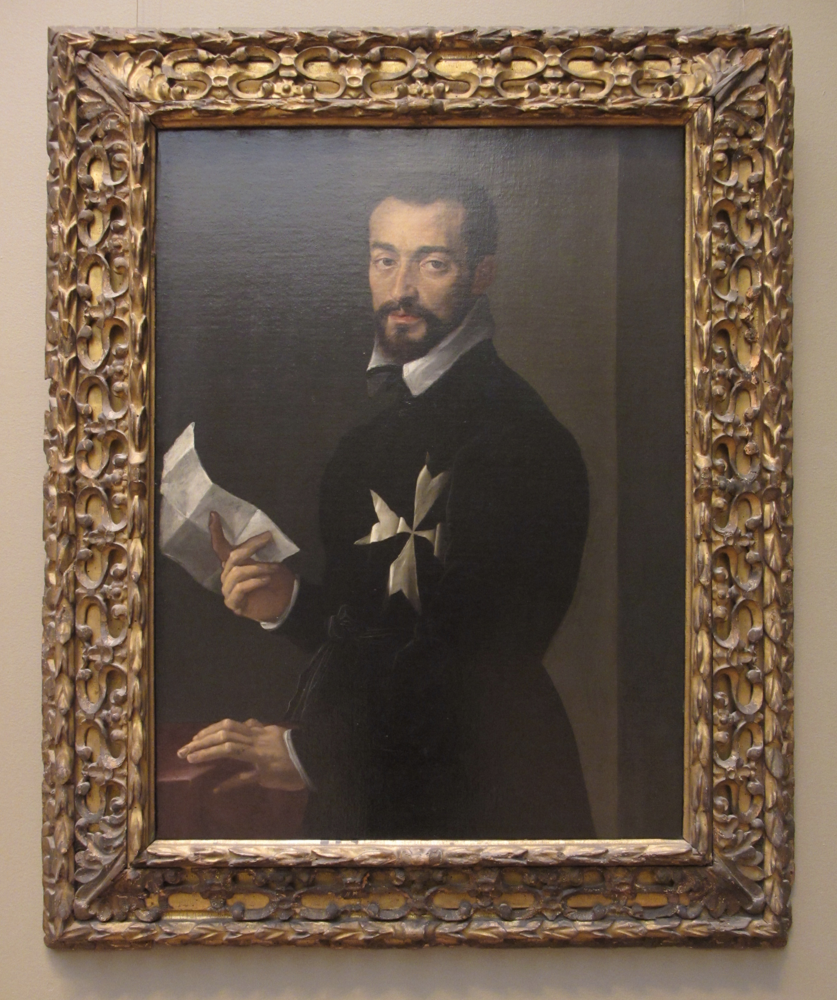

In [229]:
vertexai.vision_models.Image(base64.b64decode(image)).show()

In [230]:
mm_embedding = multimodal_embed_model.get_embeddings(image = vertexai.vision_models.Image(base64.b64decode(image)), contextual_text = 'Try This!')

In [231]:
mm_embedding.text_embedding[0:10]

[0.0165244061,
 -0.0627946928,
 0.0297892466,
 0.0234939754,
 -0.00196026824,
 0.0132641131,
 -0.00477739796,
 0.0145454649,
 -0.0382821523,
 0.0364123061]

In [232]:
mm_embedding.image_embedding[0:10]

[0.0163907781,
 0.053769581,
 -0.0164721273,
 0.0483515523,
 0.0240711141,
 -0.00591772422,
 -0.0138218813,
 0.0358078964,
 -0.00459615327,
 -0.0572002195]

In [233]:
len(mm_embedding.text_embedding), len(mm_embedding.image_embedding)

(1408, 1408)

- dot product
    - a measure of alignment of the vectors, 0 is orthogonal.
    - use as a similarity measurment
    - best to use the ranks of these in analysis since the embeddings come from a very large space and 
    - https://cloud.google.com/vertex-ai/docs/generative-ai/embeddings/get-multimodal-embeddings
- concatenation
    - simoutaneously consider multiple text passages as features
- abs difference
    - magnitude of difference for representing unique or similar qualities
- element-wise product
    - like an interaraction term: big*big=bigger, small*small=smaller, neg*pos=neg, ...
    
    
Ideas:
- embed item information
- embed category nodes
- create a diff between embedding for each item on each category
- create label of 0/1 for is the item in the category node - this is hierarchical so there will be multiple 1's for items
- build a classifier
- do restricted prediction down the hierarchy for each item choosing the best assignment at each level


Use met data for this overview notebook.
- add tf projector example for a series of products




Use ecommerce for teh actual classification model notebook

In [ ]:
https://storage.googleapis.com/data-analytics-demos/ga4_obfuscated_sample_ecommerce_images/GGCOGAPH157499.jpg

In [ ]:
gs://data-analytics-demos/ga4_obfuscated_sample_ecommerce_images

In [ ]:
with cte as (SELECT * FROM `bigquery-public-data.ga4_obfuscated_sample_ecommerce.events_20210131`,UNNEST(items) as items)SELECT count(*) count_in_category, item_category from cte group by 2order by 1 desc